# Analysis of flight delays for Newark Airport

Project Brief: See project documentation for full description.

Newark airport has requested an investigation into flight departure delays.<br /> 
Flight delays are a key performance indicator of airport operations. <br /> 
The following three business questions are explored:<br /> 

- What is the impact of weather on flight departure delays
- What other reasons impact flight departure delays
- How does Newark compare to other NY airports

In [1]:
# import libraries
import pandas as pd
import numpy as np
import pandas_profiling as pp
import datetime as dt
import seaborn as sns
from matplotlib import pyplot as plt
import folium

NB - may need to zip the flights csv - pandas can still read this in with the below...
df = pd.read_csv("/path/to/file.csv.zip")

In [2]:
# read in data
flights_all = pd.read_csv('../data/clean_data/flights_data.csv', index_col=0)

#create Newark only dataset
ewr_flights = flights_all.loc[(flights_all['origin'] == 'EWR')].copy().reset_index(drop=True)

# Preliminary analysis

## Investigating weather data

In [3]:
# profile report for weather variables
pp.ProfileReport(ewr_flights.loc[:, ['time_hour', 'dep_delay_true', 'wind_dir',
       'wind_speed', 'wind_gust', 'visib', 'temp_max', 'temp_min',
       'temp_ave', 'temp_departure', 'ppt', 'new_snow', 'snow_depth']])

Render HTML: 100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


Investigating the weather variables, `wind_speed` and `wind_gust` are highly positively correlated. As are all the temperature variables, `temp_max`, `temp_min`, `temp_ave`. <br />
Precipitation (`ppt`) has a very skewed distribution and 48% of the data is zero. The two snow variables, `new_snow` and `snow_depth` have 92% zeros in their data columns. <br />
Wind direction has a bimodal distribution. <br />
24% of the flights are delayed and 76% of the flights are not delayed.

## Investigating plane information

In [4]:
pp.ProfileReport(flights_all.loc[:,['manufacturer', 'type', 'carrier_name', 'engine', 'model']])

Render HTML: 100%|██████████| 1/1 [00:00<00:00,  8.33it/s]



- The `type` variable is highly correlated with `manufacturer` and `engine`, remove this variable. <br />
- The `manufacturer` variable has high cardinality (lots of different categories). Recode this to the top 5 manufacturers, recode NaNs to unknown and set the rest to other.

# Variable engineering and data wrangling

Random forest is known to be a good model for flight delay data. I will prepare the data for this model.

## Variable engineering

 - convert `wind_speed` into a categorical `wind_scale` using the Beaufort scale
 - drop columns with high correlation identified in pandas profiling report (`wind_gust`, `temp_max`, `temp_min`)
 - remove `type`
 - recode `manufacturer` to the top 5 manufacturers, recode NaNs to unknown and set the rest to other
 - recode `hour`, `month` and `day` as categorical variables
 - remove other columns not thought to be important for flight delay model (keep `dest_airport`): <br />
                `dest_timezone`, `dest_alt`, `dest_lon`, `dest_lat`, `dest_faa`, `ori_timezone`, `ori_lat`, `ori_lon`, <br /> `ori_airport`, `ori_faa`, `time_hour`, `minute`, `hour`, `dest`, `tailnum`, `flight`, `carrier`, `arr_delay`, <br /> `sched_arr_time`, `arr_time`, `dep_delay`, `sched_dep_time`, `dep_time`, `day`.

Leave hour but convert to categorical add am or pm

In [5]:
# add categorical wind_scale for wind_speed
wind_labels = ['Calm', 'Light Breeze', 'Gentle Breeze', 
'Moderate Breeze', 'Fresh Breeze', 'Strong Breeze', 'Near Gale',
'Gale']

wind_bins = [0, 3, 7, 12, 18, 24, 31, 38, 46]

flights_all['wind_scale'] = pd.cut(flights_all['wind_speed'], 
bins = wind_bins, labels=wind_labels,
include_lowest = True)

In [6]:
weather_drop = ['wind_gust', 'temp_max', 'temp_min']

flights_all_trim = flights_all.drop(columns=weather_drop)

In [7]:
flights_all_trim.drop(columns=['type', 'model'], inplace = True)

man_keep = ['Unknown', 'BOEING', 'AIRBUS', 'AIRBUS INDUSTRIE',
 'EMBRAER', 'BOMBARDIER INC', 'MCDONNELL DOUGLAS AIRCRAFT CO', 'MCDONNELL DOUGLAS']

flights_all_trim.manufacturer = np.where(flights_all_trim.manufacturer.isin(man_keep),
flights_all_trim.manufacturer, 'Other')

flights_all_trim.head()

,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,...,dest_faa,dest_airport,dest_lat,dest_lon,dest_alt,dest_timezone,carrier_name,manufacturer,engine,wind_scale
0,1,1,547.0,505,42.0,825.0,751,34.0,B6,1983,...,MCO,Orlando International Airport,28.429399,-81.308998,96.0,America/New_York,JetBlue Airways,Other,Turbo-fan,Gentle Breeze
1,1,1,545.0,545,0.0,833.0,831,2.0,B6,527,...,MCO,Orlando International Airport,28.429399,-81.308998,96.0,America/New_York,JetBlue Airways,AIRBUS,Turbo-fan,Gentle Breeze
2,1,1,556.0,555,1.0,709.0,714,-5.0,UA,320,...,IAD,Washington Dulles International Airport,38.944500,-77.455803,312.0,America/New_York,United Air Lines Inc.,AIRBUS INDUSTRIE,Turbo-fan,Gentle Breeze
3,1,1,1456.0,533,563.0,1757.0,843,554.0,AA,1166,...,MIA,Miami International Airport,25.793200,-80.290604,8.0,America/New_York,American Airlines Inc.,Unknown,Unknown,Gentle Breeze
4,1,1,544.0,549,-5.0,847.0,858,-11.0,AA,1399,...,MIA,Miami International Airport,25.793200,-80.290604,8.0,America/New_York,American Airlines Inc.,Unknown,Unknown,Moderate Breeze


In [8]:
#fix manufacturer doubling for airbus and mcdonnell douglas
flights_all_trim.manufacturer = flights_all_trim.manufacturer.map({
    'AIRBUS INDUSTRIE': 'AIRBUS',
    'AIRBUS': 'AIRBUS',
    'MCDONNELL DOUGLAS': 'MCDONNELL DOUGLAS',
    'MCDONNELL DOUGLAS AIRCRAFT CO': 'MCDONNELL DOUGLAS',
    'BOEING': 'BOEING',
    'EMBRAER': 'EMBRAER', 
    'BOMBARDIER INC': 'BOMBARDIER INC',
    'Unknown': 'Unknown',
    'Other': 'Other'})

flights_all_trim.head()

,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,...,dest_faa,dest_airport,dest_lat,dest_lon,dest_alt,dest_timezone,carrier_name,manufacturer,engine,wind_scale
0,1,1,547.0,505,42.0,825.0,751,34.0,B6,1983,...,MCO,Orlando International Airport,28.429399,-81.308998,96.0,America/New_York,JetBlue Airways,Other,Turbo-fan,Gentle Breeze
1,1,1,545.0,545,0.0,833.0,831,2.0,B6,527,...,MCO,Orlando International Airport,28.429399,-81.308998,96.0,America/New_York,JetBlue Airways,AIRBUS,Turbo-fan,Gentle Breeze
2,1,1,556.0,555,1.0,709.0,714,-5.0,UA,320,...,IAD,Washington Dulles International Airport,38.944500,-77.455803,312.0,America/New_York,United Air Lines Inc.,AIRBUS,Turbo-fan,Gentle Breeze
3,1,1,1456.0,533,563.0,1757.0,843,554.0,AA,1166,...,MIA,Miami International Airport,25.793200,-80.290604,8.0,America/New_York,American Airlines Inc.,Unknown,Unknown,Gentle Breeze
4,1,1,544.0,549,-5.0,847.0,858,-11.0,AA,1399,...,MIA,Miami International Airport,25.793200,-80.290604,8.0,America/New_York,American Airlines Inc.,Unknown,Unknown,Moderate Breeze


In [9]:
flights_all_trim.shape

(294167, 43)

### convert timeseries data into categories

In [10]:
flights_all_trim['month_flag'] = flights_all_trim.month.astype(str)

flights_all_trim['month_flag'] = flights_all_trim['month_flag'].map({
    '1': 'Jan',
    '2': 'Feb',
    '3': 'Mar',
    '4': 'Apr',
    '5': 'May',
    '6': 'Jun', 
    '7': 'Jul',
    '8': 'Aug',
    '9': 'Sep',
    '10': 'Oct',
    '11': 'Nov',
    '12': 'Dec'})

In [11]:
flights_all_trim.loc[:, 'time_hour'] = pd.to_datetime(flights_all_trim.time_hour, yearfirst=True)

flights_all_trim['weekday'] = flights_all_trim['time_hour'].dt.day_name()

In [12]:
flights_all_trim['weekday'] = flights_all_trim['time_hour'].dt.day_name()

In [13]:
flights_all_trim['hour'] = pd.Categorical(flights_all_trim['hour'], ordered = True)

In [14]:
to_drop=['dest_timezone', 'ori_alt', 'dest_lon', 'dest_lat', 'dest_faa', 
'ori_timezone', 'ori_lat', 'ori_lon', 'ori_airport', 'ori_faa', 'time_hour', 
'minute', 'dest', 'tailnum', 'flight', 'carrier', 'arr_delay', 'sched_arr_time', 
'arr_time', 'dep_delay', 'month', 'sched_dep_time','dep_time', 'day']

flights_model_data = flights_all_trim.drop(columns=to_drop)

Remove data for EWR (Newark) - save the rest of the data for future work, can run the model on the data for the other airports to see how it performs

In [15]:
# split into EWR, and the others
ewr_model_data = flights_model_data.loc[(flights_model_data['origin'] == 'EWR')].copy()

# Exploratory Data Analysis

I will start with an overview of departure delays across all airports and then move to delays at EWR, focusing on weather and other factors.

In [16]:
# set figure sizes for all plots
plt.rcParams['figure.figsize'] = [5, 3]
plt.rcParams['figure.dpi'] = 120
plt.rcParams['font.size'] = 10

In [17]:
flights_all_trim.loc[:, 'dep_delay_count'] = flights_all_trim.groupby(['origin', 'month']).dep_delay_true.transform('sum')
flights_all_trim.loc[:, 'total_flight_count'] = flights_all_trim.groupby(['origin', 'month']).dep_delay.transform('count')
flights_all_trim.loc[:, 'percent_delay'] = (flights_all_trim.dep_delay_count / flights_all_trim.total_flight_count) * 100



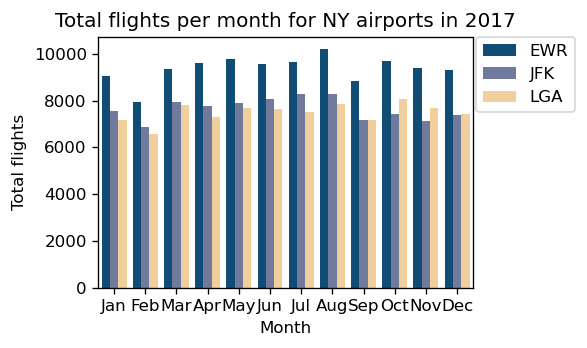

In [18]:
hue_order = ['EWR', 'JFK', 'LGA']
all_flights_pal = sns.color_palette(['#005083', '#6876a4', '#ffd28f'])

sns.barplot(
    x = 'month_flag', y = 'total_flight_count', 
    hue = 'origin', palette = all_flights_pal, 
    hue_order = hue_order, data = flights_all_trim)
plt.title("Total flights per month for NY airports in 2017")
plt.xlabel("Month")
plt.ylabel("Total flights")
plt.legend(bbox_to_anchor=(1.01, 1), loc = 2,
           borderaxespad=0)
plt.tight_layout()
plt.savefig('./figures/all_airports_total_plot.png', pad_inches=0.5);

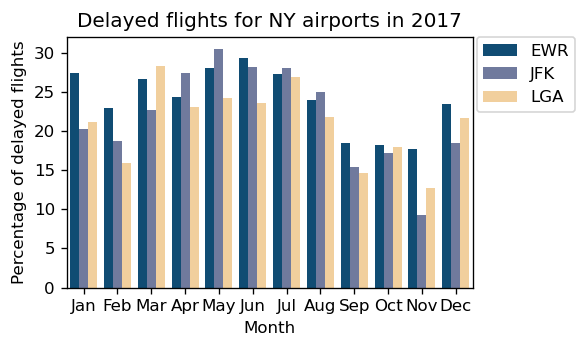

In [19]:
sns.barplot(
    x = 'month_flag', y = 'percent_delay', 
    hue = 'origin', hue_order = hue_order, 
    palette = all_flights_pal, data = flights_all_trim)
plt.title("Delayed flights for NY airports in 2017")
plt.xlabel("Month")
plt.ylabel("Percentage of delayed flights")
plt.legend(bbox_to_anchor=(1.01, 1), loc = 2,
           borderaxespad=0)
plt.tight_layout()
plt.savefig('./figures/all_airports_delays_plot.png', pad_inches=0.5);

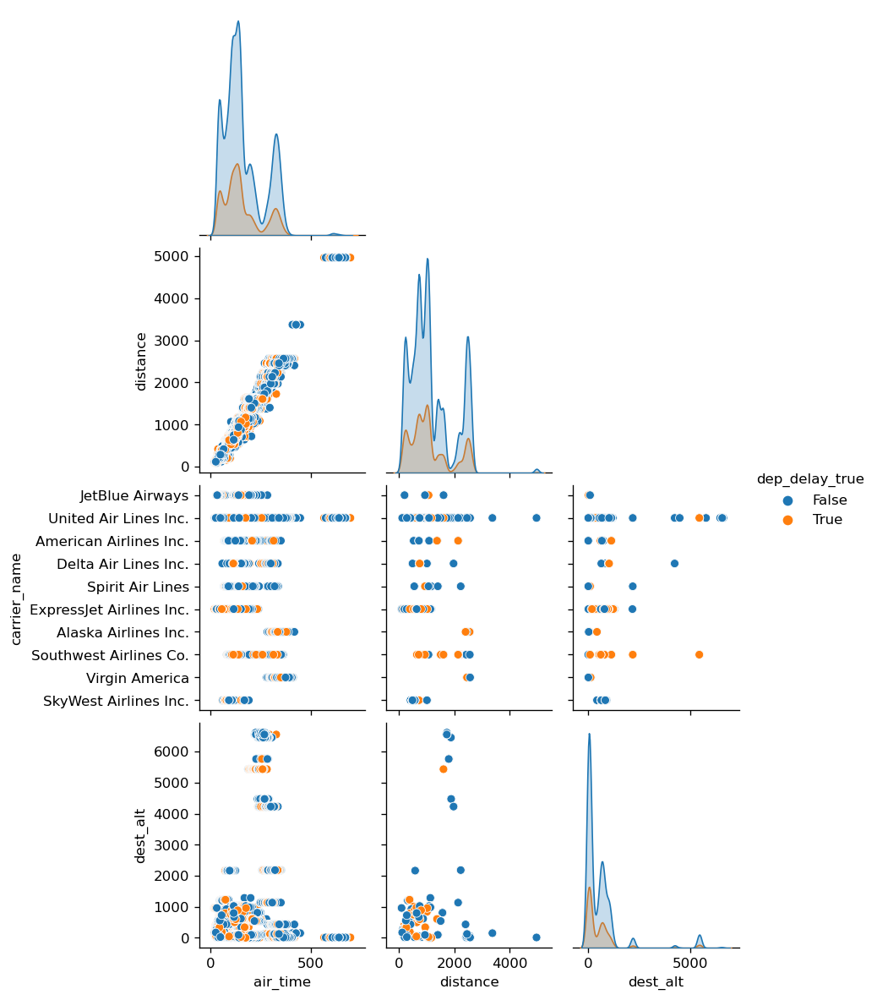

In [20]:
sns.pairplot(ewr_model_data,
x_vars=['air_time', 'distance', 'dest_alt'],
y_vars=['air_time', 'distance', 'carrier_name', 'dest_alt'],
hue = 'dep_delay_true',
corner = True)

In [21]:
ewr_all = flights_all_trim.loc[(flights_all_trim['origin'] == 'EWR')].copy().reset_index(drop = True)

In [22]:
# function to create a column with percentage of delayed flights per grouping column (col)
def percent_delay(col):
    ewr_all.loc[:, 'dep_delay_per_'+ col] = ewr_all.groupby([col]).dep_delay_true.transform('sum')
    ewr_all.loc[:, 'total_flights_per_' + col] = ewr_all.groupby([col]).dep_delay.transform('count')
    ewr_all.loc[:, 'percent_delay_per_' + col] = (ewr_all['dep_delay_per_'+ col] / ewr_all['total_flights_per_' + col]) * 100

## EDA weather and flight delays

In [23]:
# set custom graph options

line_pal = sns.color_palette(['#f9ab00', '#49006a'])

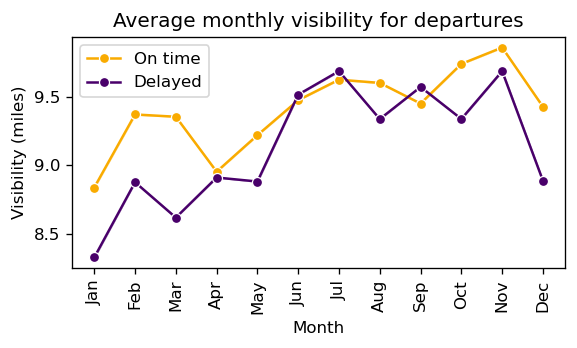

In [24]:
visib_plot = sns.lineplot(
    x = 'month_flag',
    y = 'visib',
    hue = 'dep_delay_true',
    marker = 'o',
    ci = False,
    palette = line_pal,
    data = ewr_all)
plt.xticks(rotation=90)
plt.xlabel('Month')
plt.ylabel('Visibility (miles)')
plt.title('Average monthly visibility for departures')
plt.legend(title='', labels=['On time', 'Delayed'])
plt.tight_layout()
plt.savefig('./figures/visib_plot.png', pad_inches=0.5);

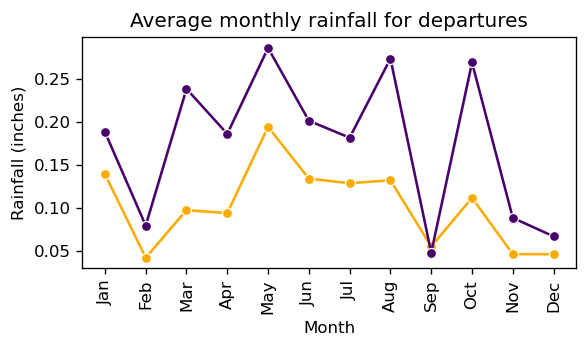

In [25]:
sns.lineplot(x = 'month_flag',
y = 'ppt',
hue = 'dep_delay_true',
marker='o',
palette = line_pal,
ci=False,
legend=False,
data = ewr_all)
plt.xticks(rotation=90)
plt.xlabel('Month')
plt.ylabel('Rainfall (inches)')
plt.title('Average monthly rainfall for departures')
#plt.legend(title='', labels=['Not delayed', 'Delayed'])
plt.tight_layout()
plt.savefig('./figures/ppt_plot.png', pad_inches=0.5);

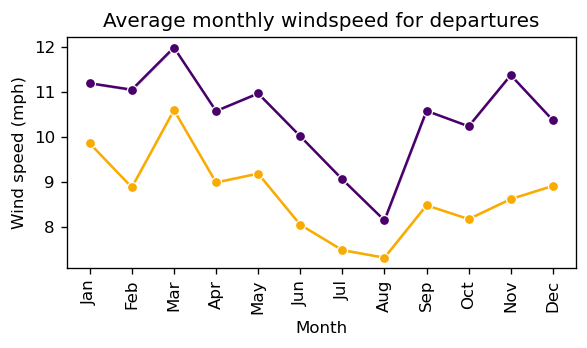

In [26]:
sns.lineplot(x = 'month_flag',
y = 'wind_speed',
hue = 'dep_delay_true',
marker='o',
palette = line_pal,
ci = False,
legend = False,
data = ewr_all)
plt.xticks(rotation=90)
plt.xlabel('Month')
plt.ylabel('Wind speed (mph)')
plt.title('Average monthly windspeed for departures')
#plt.legend(title='', labels=['Not delayed', 'Delayed'])
plt.tight_layout()
plt.savefig('./figures/windspeed_plot.png', pad_inches=0.5);


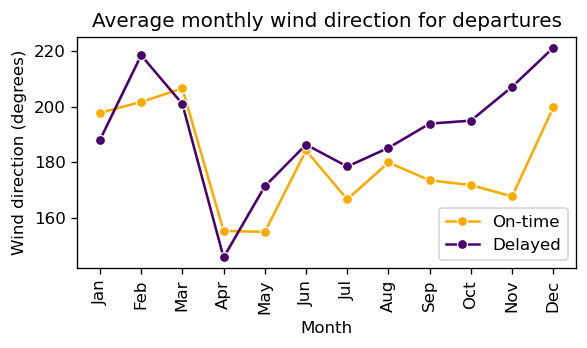

In [27]:
sns.lineplot(x = 'month_flag',
y = 'wind_dir',
hue = 'dep_delay_true',
marker='o',
palette = line_pal,
ci = False,
data = ewr_all)
plt.xticks(rotation=90)
plt.xlabel('Month')
plt.ylabel('Wind direction (degrees)')
plt.title('Average monthly wind direction for departures')
plt.legend(title='', labels=['On-time', 'Delayed'])
plt.tight_layout()
plt.savefig('./figures/wind_dir_plot.png', pad_inches=0.7);


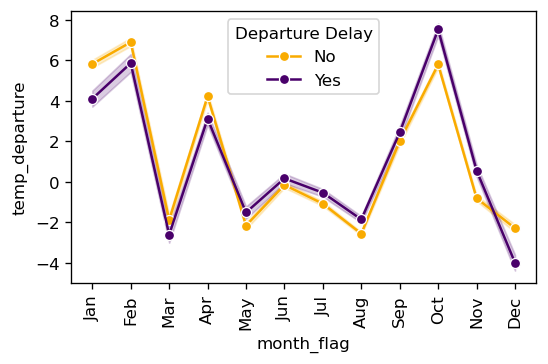

In [28]:
sns.lineplot(x = 'month_flag',
y = 'temp_departure',
hue = 'dep_delay_true',
marker='o',
palette = line_pal,
data = ewr_all)
plt.xticks(rotation=90)
plt.legend(title='Departure Delay', labels=['No', 'Yes']);

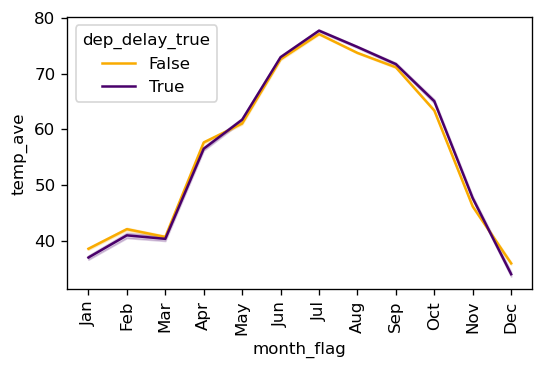

In [29]:
sns.lineplot(x = 'month_flag',
y = 'temp_ave',
hue = 'dep_delay_true',
palette = line_pal,
data = ewr_all)
plt.xticks(rotation=90);

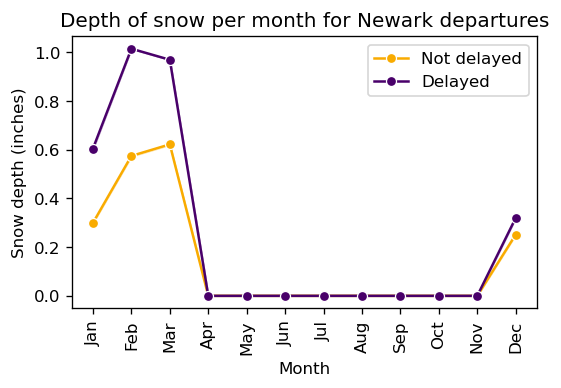

In [30]:
sns.lineplot(x = 'month_flag',
y = 'snow_depth',
marker='o',
hue = 'dep_delay_true',
palette = line_pal,
ci = False,
data = ewr_all)
plt.xticks(rotation=90)
plt.xlabel('Month')
plt.ylabel('Snow depth (inches)')
plt.title('Depth of snow per month for Newark departures')
plt.legend(title='', labels=['Not delayed', 'Delayed']);

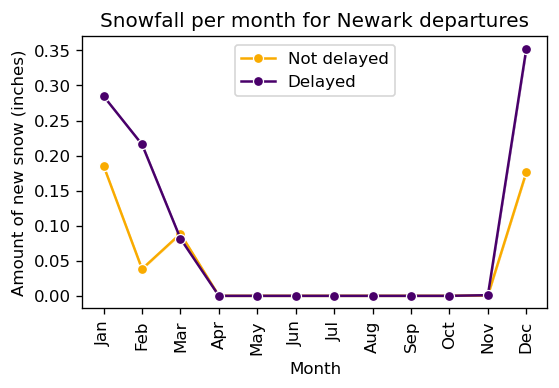

In [31]:
sns.lineplot(x = 'month_flag',
y = 'new_snow',
hue = 'dep_delay_true',
marker='o',
palette = line_pal,
ci = False,
data = ewr_all)
plt.xticks(rotation=90)
plt.xlabel('Month')
plt.ylabel('Amount of new snow (inches)')
plt.title('Snowfall per month for Newark departures')
plt.legend(title='', labels=['Not delayed', 'Delayed']);

For presentation, select graphs which show differences in flight delays over different months.

## EDA for other reasons for delays

### Carrier delays

In [32]:
percent_delay('carrier_name')
carrier = ewr_all.drop_duplicates(subset=['carrier_name']).reset_index(drop = True)

ordered_data = carrier.sort_values('percent_delay_per_carrier_name').carrier_name

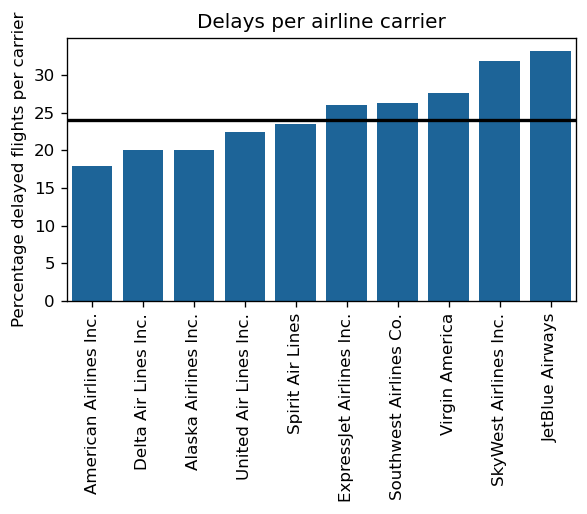

In [33]:
sns.barplot(
    x = 'carrier_name',
    y = 'percent_delay_per_carrier_name',
    color = '#0868ac',
    order = ordered_data,
    data = carrier)
plt.xticks(rotation=90)
plt.axhline(y = 24, linewidth=2, color='black')
plt.xlabel('')
plt.ylabel('Percentage delayed flights per carrier')
plt.title('Delays per airline carrier')
plt.tight_layout()
plt.subplots_adjust(bottom=0.15)
plt.savefig('./figures/carrier_delays_plot.png', dpi = 400, pad_inches=0.85, bbox_inches='tight');

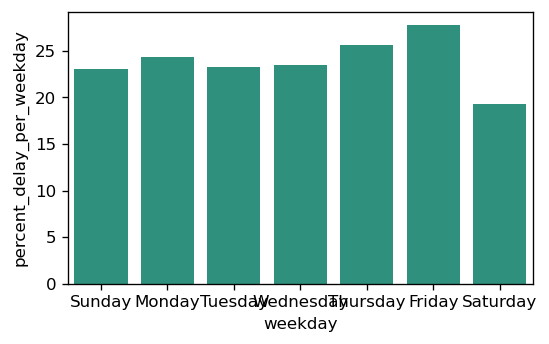

In [34]:
percent_delay('weekday')

sns.barplot(y = 'percent_delay_per_weekday',
x = 'weekday',
color = '#1fa187',
data = ewr_all);

<AxesSubplot:xlabel='hour', ylabel='percent_delay_per_hour'>

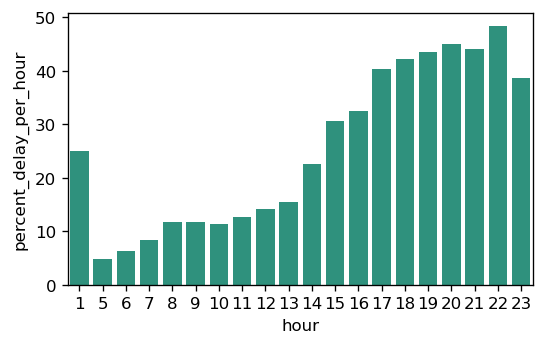

In [35]:
percent_delay('hour')

sns.barplot(y = 'percent_delay_per_hour',
x = 'hour',
color = '#1fa187',
data = ewr_all)

# Random Forest Modeling

In [36]:
ewr_model_data.head()

,origin,air_time,distance,hour,dep_delay_true,wind_dir,wind_speed,visib,temp_ave,temp_departure,...,new_snow,snow_depth,dest_airport,dest_alt,carrier_name,manufacturer,engine,wind_scale,month_flag,weekday
1,EWR,136.0,937,5,False,220.0,11.5078,10.0,41.5,7.2,...,0.0,0.0,Orlando International Airport,96.0,JetBlue Airways,AIRBUS,Turbo-fan,Gentle Breeze,Jan,Sunday
2,EWR,45.0,212,5,False,220.0,11.5078,10.0,41.5,7.2,...,0.0,0.0,Washington Dulles International Airport,312.0,United Air Lines Inc.,AIRBUS,Turbo-fan,Gentle Breeze,Jan,Sunday
13,EWR,154.0,1085,6,False,230.0,10.9300,10.0,41.5,7.2,...,0.0,0.0,Miami International Airport,8.0,American Airlines Inc.,Unknown,Unknown,Gentle Breeze,Jan,Sunday
14,EWR,153.0,1065,6,False,230.0,10.9300,10.0,41.5,7.2,...,0.0,0.0,Fort Lauderdale Hollywood International Airport,9.0,JetBlue Airways,AIRBUS,Turbo-fan,Gentle Breeze,Jan,Sunday
20,EWR,42.0,200,6,True,230.0,10.9300,10.0,41.5,7.2,...,0.0,0.0,General Edward Lawrence Logan International Ai...,20.0,United Air Lines Inc.,AIRBUS,Turbo-fan,Gentle Breeze,Jan,Sunday


In [37]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.tree import plot_tree
from sklearn.tree import export_text
from sklearn.metrics import confusion_matrix
from sklearn.metrics import mean_absolute_error
from sklearn.inspection import permutation_importance

In [38]:
ewr_model_data.reset_index(drop=True, inplace=True)

In [39]:
ewr_model_data_trim = ewr_model_data.drop(columns=['air_time', 'wind_scale', 'origin', 'dest_alt']).copy()
ewr_model_data_trim.dropna(inplace=True)

Model test with all the data

In [40]:

# one hot encoding
ewr_model_data_trim = pd.get_dummies(ewr_model_data_trim)

# split into predictors and response
ewr_predictors = ewr_model_data_trim.drop(columns = 'dep_delay_true')
ewr_response = ewr_model_data_trim['dep_delay_true']

# list of predictor names for later labelling
ewr_X_names = list(ewr_predictors)

# convert to numpy arrays for modelling
ewr_predictors = np.nan_to_num(ewr_predictors.astype(np.float32))
ewr_response = np.array(ewr_response)

# split data into test and train
# stratify on response as it is skewed 24% to 76%
ewr_X_train, ewr_X_test, ewr_y_train, ewr_y_test = \
    train_test_split(ewr_predictors, ewr_response, test_size = 0.2, 
    random_state = 42,
    stratify = ewr_response)

Establish a baseline model

In [41]:
# set baseline model to test against - use dummy classifier!
from sklearn.dummy import DummyClassifier

clf_dummy = DummyClassifier(random_state=42)
clf_dummy.fit(ewr_X_train, ewr_y_train)

DummyClassifier(random_state=42)

In [42]:
# model metrics for baseline model
print("Accuracy", (clf_dummy.score(ewr_X_test, ewr_y_test)) * 100)

ewr_y_pred_test = clf_dummy.predict(ewr_X_test)
ewr_y_pred_train = clf_dummy.predict(ewr_X_train)

print("MAE train", mean_absolute_error(ewr_y_train.astype('int'),
                                        ewr_y_pred_train.astype('int')))
print("MAE test", mean_absolute_error(ewr_y_test.astype('int'),
                                         ewr_y_pred_test.astype('int')))

Accuracy 76.02925243770315
MAE train 0.23969031442565966
MAE test 0.23970747562296857


# Random forest with everything in it

In [43]:
ewr_model_all = RandomForestClassifier(n_estimators = 1000,
                                    min_samples_leaf=5,
                                    max_depth=10,
                                    random_state = 42)

ewr_model_all.fit(ewr_X_train, ewr_y_train)

RandomForestClassifier(max_depth=10, min_samples_leaf=5, n_estimators=1000,
                       random_state=42)

In [44]:
print("Training Accuracy", (ewr_model_all.score(ewr_X_train, ewr_y_train)) * 100)
# model metrics for weather variable model
print("Accuracy", (ewr_model_all.score(ewr_X_test, ewr_y_test)) * 100)

ewr_y_pred_test = ewr_model_all.predict(ewr_X_test)
ewr_y_pred_train = ewr_model_all.predict(ewr_X_train)

print("MAE train", mean_absolute_error(ewr_y_train.astype('int'),
                                        ewr_y_pred_train.astype('int')))
print("MAE test", mean_absolute_error(ewr_y_test.astype('int'),
                                         ewr_y_pred_test.astype('int')))

Training Accuracy 76.44629031894003
Accuracy 76.32719393282773
MAE train 0.23553709681059973
MAE test 0.23672806067172264


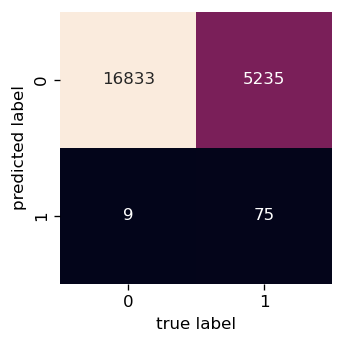

In [45]:
mat = confusion_matrix(ewr_y_test, ewr_y_pred_test)
sns.heatmap(mat.T, square = True, annot = True, fmt = 'd', cbar = False)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [46]:
# Get numerical feature importances
importances = list(ewr_model_all.feature_importances_)

# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(ewr_X_names, importances)]

# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)

# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: wind_speed           Importance: 0.1
Variable: ppt                  Importance: 0.08
Variable: hour_6               Importance: 0.08
Variable: hour_19              Importance: 0.07
Variable: hour_20              Importance: 0.07
Variable: hour_17              Importance: 0.05
Variable: hour_18              Importance: 0.05
Variable: hour_21              Importance: 0.05
Variable: wind_dir             Importance: 0.04
Variable: hour_7               Importance: 0.04
Variable: visib                Importance: 0.03
Variable: temp_ave             Importance: 0.03
Variable: hour_8               Importance: 0.03
Variable: temp_departure       Importance: 0.02
Variable: hour_9               Importance: 0.02
Variable: carrier_name_JetBlue Airways Importance: 0.02
Variable: distance             Importance: 0.01
Variable: new_snow             Importance: 0.01
Variable: snow_depth           Importance: 0.01
Variable: hour_5               Importance: 0.01
Variable: hour_10              Im

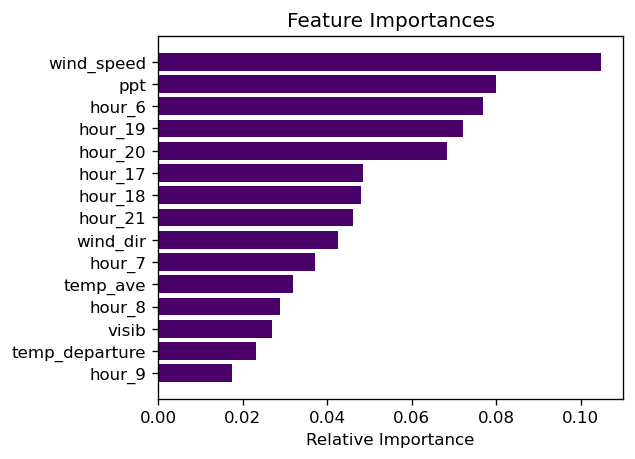

In [47]:
# make feature importance plot
features = ewr_X_names
importances = ewr_model_all.feature_importances_
indices = np.argsort(importances)

# customized number 
num_features = 15 

plt.figure(figsize=(5, 4))
plt.title('Feature Importances')

# only plot the customized number of features
plt.barh(range(num_features), importances[indices[-num_features:]], color='#49006a', align='center')
plt.yticks(range(num_features), [features[i] for i in indices[-num_features:]])
plt.xlabel('Relative Importance')
plt.show()

In [48]:
# permutation importance
result = permutation_importance(ewr_model_all, ewr_X_test, ewr_y_test, n_repeats=10,
random_state=42, n_jobs=2)

for i in result.importances_mean.argsort()[::-1]: 
    if result.importances_mean[i] - 2 * result.importances_std[i] > 0:
        print(f"{ewr_X_names[i]:<8}"
        f"{result.importances_mean[i]:.3f}"
        f" +/- {result.importances_std[i]:.3f}")

Can remove dest_airport, engine and manufacturer

In [ ]:
ewr_model_data.shape

In [ ]:
ewr_model_trim = ewr_model_data.drop(
    columns=['air_time', 'wind_scale', 'dest_airport', 'engine', 'manufacturer', 'temp_ave', 'temp_departure']).copy()

ewr_model_trim.dropna(inplace=True)

ewr_model_trim.shape

In [ ]:
# one hot encoding
ewr_model_trim = pd.get_dummies(ewr_model_trim)

# split into predictors and response
ewr_predictors = ewr_model_trim.drop(columns = 'dep_delay_true')
ewr_response = ewr_model_trim['dep_delay_true']

# list of predictor names for later labelling
ewr_X_names = list(ewr_predictors)

# convert to numpy arrays for modelling
ewr_predictors = np.nan_to_num(ewr_predictors.astype(np.float32))
ewr_response = np.array(ewr_response)

# split data into test and train
# stratify on response as it is skewed 24% to 76%
ewr_X_train, ewr_X_test, ewr_y_train, ewr_y_test = \
    train_test_split(ewr_predictors, ewr_response, test_size = 0.2, 
    random_state = 42,
    stratify = ewr_response)

Establish a baseline

In [ ]:
clf_dummy = DummyClassifier(random_state=42)
clf_dummy.fit(ewr_X_train, ewr_y_train)

# model metrics for baseline model
print("Accuracy", (clf_dummy.score(ewr_X_test, ewr_y_test)) * 100)

ewr_y_pred_test = clf_dummy.predict(ewr_X_test)
ewr_y_pred_train = clf_dummy.predict(ewr_X_train)

print("MAE train", mean_absolute_error(ewr_y_train.astype('int'),
                                        ewr_y_pred_train.astype('int')))
print("MAE test", mean_absolute_error(ewr_y_test.astype('int'),
                                         ewr_y_pred_test.astype('int')))

In [ ]:
ewr_model_final = RandomForestClassifier(n_estimators = 1000,
                                    min_samples_leaf=3,
                                    #max_depth=10,
                                    random_state = 42)

ewr_model_final.fit(ewr_X_train, ewr_y_train)

In [ ]:
# model metrics for final model
print("Training Accuracy", (ewr_model_final.score(ewr_X_train, ewr_y_train)) * 100)
print("Accuracy", (ewr_model_final.score(ewr_X_test, ewr_y_test)) * 100)

ewr_y_pred_test = ewr_model_final.predict(ewr_X_test)
ewr_y_pred_train = ewr_model_final.predict(ewr_X_train)

print("MAE train", mean_absolute_error(ewr_y_train.astype('int'),
                                        ewr_y_pred_train.astype('int')))
print("MAE test", mean_absolute_error(ewr_y_test.astype('int'),
                                         ewr_y_pred_test.astype('int')))

In [ ]:
mat = confusion_matrix(ewr_y_test, ewr_y_pred_test)
sns.heatmap(mat.T, square = True, annot = True, fmt = 'd', cbar = False)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [ ]:
# Get numerical feature importances
importances = list(ewr_model_final.feature_importances_)

# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(ewr_X_names, importances)]

# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)

# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

In [ ]:
# make feature importance plot
features = ewr_X_names
importances = ewr_model_final.feature_importances_
indices = np.argsort(importances)

# customized number 
num_features = 15 

plt.figure(figsize=(5, 4))
plt.title('Feature Importances')

# only plot the customized number of features
plt.barh(range(num_features), importances[indices[-num_features:]], color='#49006a', align='center')
plt.yticks(range(num_features), [features[i] for i in indices[-num_features:]])
plt.xlabel('Relative Importance')
plt.show()

In [ ]:
result = permutation_importance(ewr_model_final, ewr_X_test, ewr_y_test, n_repeats=10,
random_state=42, n_jobs=2)

for i in result.importances_mean.argsort()[::-1]: 
    if result.importances_mean[i] - 2 * result.importances_std[i] > 0:
        print(f"{ewr_X_names[i]:<8}"
        f"{result.importances_mean[i]:.3f}"
        f" +/- {result.importances_std[i]:.3f}")

In [ ]:
# make permutation importance plot
features = ewr_X_names
importances = result.importances_mean
indices = np.argsort(importances)

# customized number 
num_features = 15 

plt.figure(figsize=(5, 4))
plt.title('Feature Permutation Importances')

# only plot the customized number of features
plt.barh(range(num_features), importances[indices[-num_features:]], color='#49006a', align='center')
plt.yticks(range(num_features), [features[i] for i in indices[-num_features:]])
plt.xlabel('Relative Importance')
plt.show()